# This is a sample Jupyter Notebook

Below is an example of a code cell. 
Put your cursor into the cell and press Shift+Enter to execute it and select the next one, or click 'Run Cell' button.

Press Double Shift to search everywhere for classes, files, tool windows, actions, and settings.

To learn more about Jupyter Notebooks in PyCharm, see [help](https://www.jetbrains.com/help/pycharm/ipython-notebook-support.html).
For an overview of PyCharm, go to Help -> Learn IDE features or refer to [our documentation](https://www.jetbrains.com/help/pycharm/getting-started.html).

In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('./data/train.csv').sample(frac=0.1)
## Convert the 'Dates' column to only month and year
df['Dates'] = pd.to_datetime(df['Dates']).dt.to_period('M')

In [3]:
df.head(5)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
116521,2013-10,ROBBERY,"ROBBERY ON THE STREET, STRONGARM",Saturday,TENDERLOIN,NONE,TAYLOR ST / TURK ST,-122.410769,37.783215
742053,2004-10,LARCENY/THEFT,PETTY THEFT FROM LOCKED AUTO,Thursday,CENTRAL,NONE,1500 Block of JONES ST,-122.414986,37.795433
518753,2008-01,OTHER OFFENSES,MISCELLANEOUS INVESTIGATION,Tuesday,SOUTHERN,NONE,200 Block of INTERSTATE80 HY,-122.365565,37.809671
165197,2013-03,DRUG/NARCOTIC,SALE OF BASE/ROCK COCAINE,Thursday,MISSION,"ARREST, BOOKED",2000 Block of MISSION ST,-122.419658,37.764221
162173,2013-03,WARRANTS,ENROUTE TO DEPARTMENT OF CORRECTIONS,Thursday,TENDERLOIN,"ARREST, BOOKED",100 Block of GOLDEN GATE AV,-122.413048,37.781912


In [4]:
df.tail()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
310083,2011-02,OTHER OFFENSES,TRAFFIC VIOLATION,Monday,INGLESIDE,"ARREST, CITED",OCEAN AV / CAYUGA AV,-122.438808,37.723601
30921,2014-12,NON-CRIMINAL,AIDED CASE -PROPERTY FOR DESTRUCTION,Saturday,PARK,NONE,0 Block of BEULAH ST,-122.450911,37.767536
423723,2009-05,NON-CRIMINAL,"AIDED CASE, MENTAL DISTURBED",Tuesday,MISSION,PSYCHOPATHIC CASE,2800 Block of MISSION ST,-122.418434,37.751420
659549,2006-01,BURGLARY,"BURGLARY OF APARTMENT HOUSE, FORCIBLE ENTRY",Sunday,INGLESIDE,NONE,500 Block of HURON AV,-122.447810,37.713523
295243,2011-04,PROSTITUTION,LOITERING FOR PURPOSE OF PROSTITUTION,Saturday,NORTHERN,NONE,POLK ST / CALIFORNIA ST,-122.420692,37.790577


In [5]:
df.shape

(87805, 9)

In [6]:
df.isnull().sum()

Dates         0
Category      0
Descript      0
DayOfWeek     0
PdDistrict    0
Resolution    0
Address       0
X             0
Y             0
dtype: int64

In [7]:
df.dtypes

Dates         period[M]
Category         object
Descript         object
DayOfWeek        object
PdDistrict       object
Resolution       object
Address          object
X               float64
Y               float64
dtype: object

<Axes: >

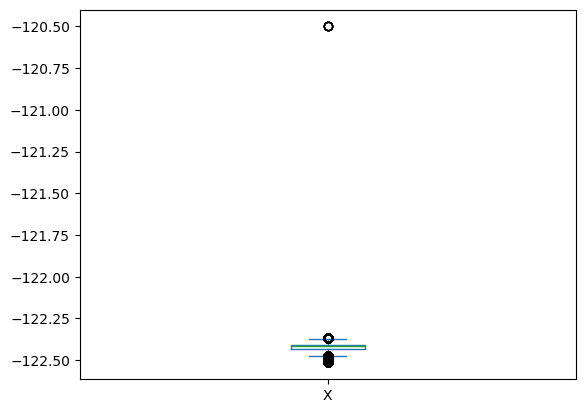

In [8]:
df['X'].plot.box()

<Axes: >

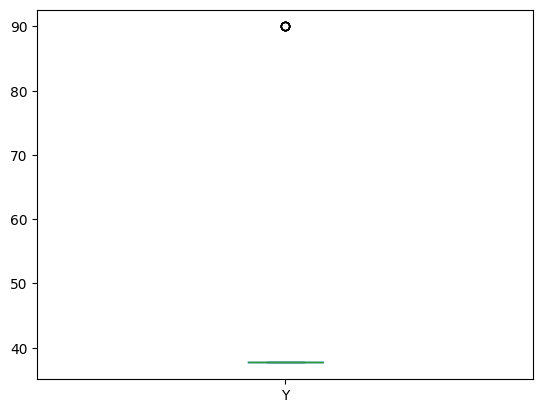

In [232]:
df['Y'].plot.box()

In [10]:
import plotly.express as px

In [11]:
px.scatter(df, x='X', y='Y')

In [12]:
from sklearn.preprocessing import LabelEncoder

In [13]:
df_train = df[['Dates', 'Category', 'X', 'Y']]
enc = LabelEncoder()
df_train['Dates'] = enc.fit_transform(df_train['Dates'])
df_train['Category'] = enc.fit_transform(df_train['Category'])
print(df_train.dtypes)
df_train.shape

Dates         int64
Category      int64
X           float64
Y           float64
dtype: object


/var/folders/r6/t0kp5kps0dq_hnsz5wmbfhmr0000gn/T/ipykernel_36286/3027591831.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/r6/t0kp5kps0dq_hnsz5wmbfhmr0000gn/T/ipykernel_36286/3027591831.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(87805, 4)

In [14]:
df_train.head()

,Dates,Category,X,Y
116521,129,25,-122.410769,37.783215
742053,21,16,-122.414986,37.795433
518753,60,21,-122.365565,37.809671
165197,122,7,-122.419658,37.764221
162173,122,37,-122.413048,37.781912


In [238]:
df_train.tail()

,Dates,Category,X,Y
70272,137,13,-122.435318,37.764102
729692,24,16,-122.406959,37.789435
833312,7,16,-122.432168,37.780980
600581,46,15,-122.408053,37.781567
612014,44,25,-122.422721,37.779726


In [15]:
df_test = df_train.sample(frac=0.1)
df_test.shape


(8780, 4)

In [240]:
df_test.head()

,Dates,Category,X,Y
152877,124,21,-122.399869,37.730293
337777,92,13,-122.428950,37.767503
690583,30,4,-122.389832,37.731939
685559,31,36,-122.437236,37.772204
852373,4,21,-122.387729,37.731232


In [241]:
df_train.tail()

,Dates,Category,X,Y
70272,137,13,-122.435318,37.764102
729692,24,16,-122.406959,37.789435
833312,7,16,-122.432168,37.780980
600581,46,15,-122.408053,37.781567
612014,44,25,-122.422721,37.779726


In [16]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(df_train[['Dates', 'X', 'Y']], df_train['Category'], test_size=0.2)

In [17]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(x_train, y_train)

/Users/barbaramichaud/Desktop/MASTER/IA-ML-Crime/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [18]:
model.score(x_test, y_test)

0.19628722737885088

In [19]:
result = model.predict(x_test[1:2])
print(result)
x_test[1:2]

[16]


,Dates,X,Y
365676,87,-122.439776,37.736543


In [20]:
decode = enc.inverse_transform(result)

In [21]:
decode

array(['LARCENY/THEFT'], dtype=object)